In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import anndata
from sklearn.decomposition import PCA
from kneed import KneeLocator

# sittings
sns.set_style("ticks",{'axes.grid' : True})
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)

# Load the data form each sample
read_10x_mtx will compile the 3 files you have with prefix `GSM6204109_P01_` into one AnnData object with n_obs × n_vars
* n_obs: barcodes
* n_vars: genes

Immediately filter out any cells that has less than 200 genes

# Annotate mitochondrial genes as 'mt' and the ribosomal genes as 'ribo'
* Mitochondrial genes are taged with MT for human genes
* Ribosomal genes are not taged, so you have to compare the genes to a list of known ribosomal genes.
 
Ribosomal genes can be downloaded as csv from: https://www.gsea-msigdb.org/gsea/msigdb/human/download_geneset.jsp?geneSetName=KEGG_RIBOSOME&fileType=CSV

# Calculate the quality control metrics then visualize them as violin plot
* Number of genes expressed in the count matrix
* Total counts per cell
* Percentage of counts in mitochondrial genes
* Percentage of counts in ribosomal genes

# Filtering the low quality data (out layer cells that has too high values of the following metrics)
* Number of genes expressed
* Metaconderial genes percentage
* Ribosomal genes percentage

... reading from cache file cache/data-GSE205013_RAW-GSM6204109_P01_matrix.h5ad
filtered out 774 cells that have less than 500 genes expressed


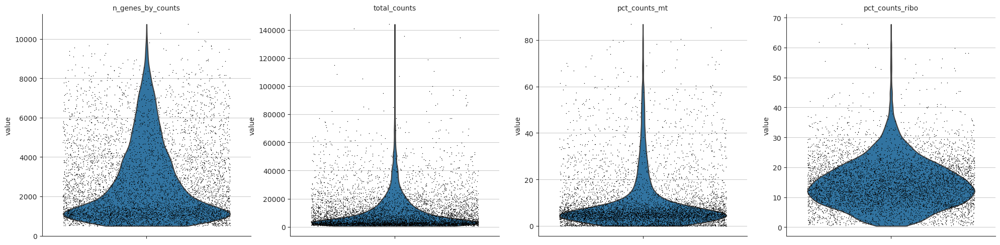

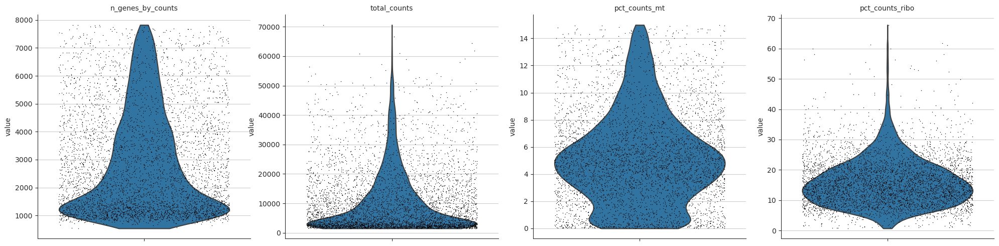

... reading from cache file cache/data-GSE205013_RAW-GSM6204110_P02_matrix.h5ad
filtered out 823 cells that have less than 500 genes expressed


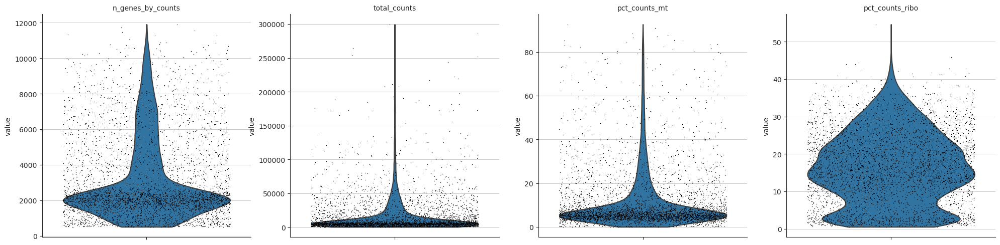

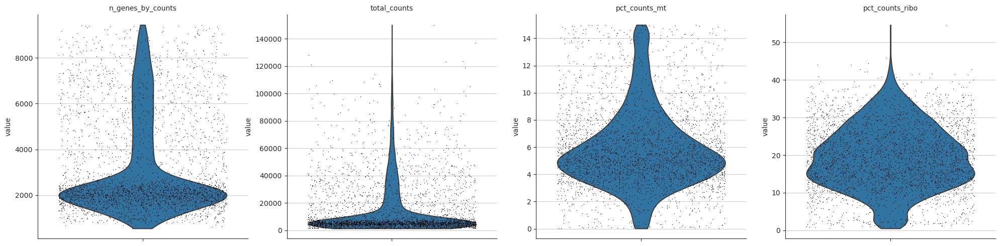

... reading from cache file cache/data-GSE205013_RAW-GSM6204111_P03_matrix.h5ad
filtered out 3094 cells that have less than 500 genes expressed


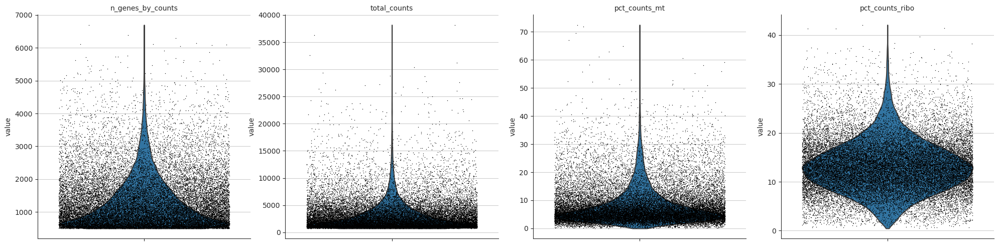

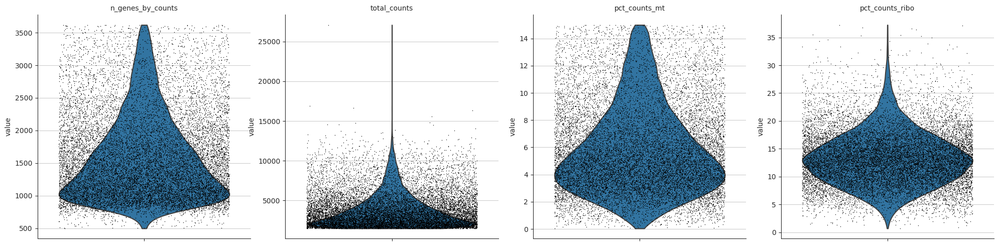

... reading from cache file cache/data-GSE205013_RAW-GSM6204112_P04_matrix.h5ad
filtered out 846 cells that have less than 500 genes expressed


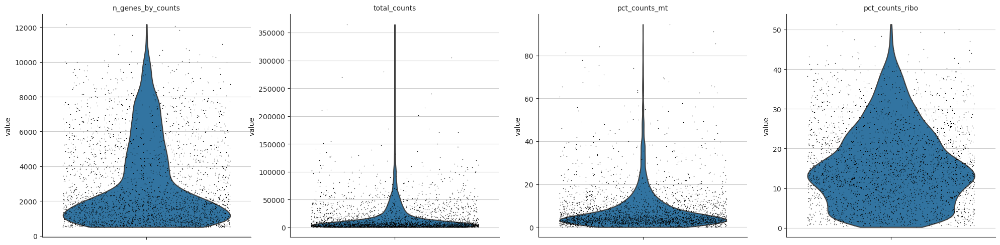

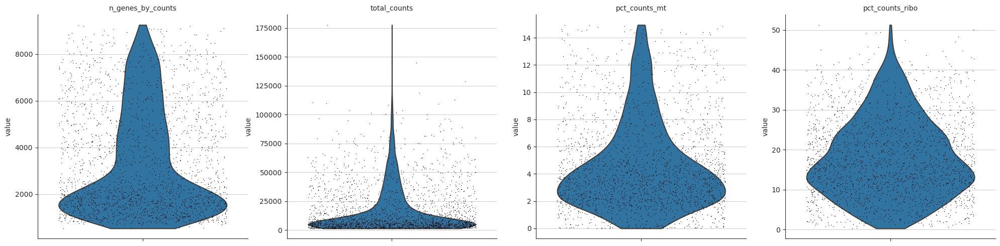

... reading from cache file cache/data-GSE205013_RAW-GSM6204113_P05_matrix.h5ad
filtered out 644 cells that have less than 500 genes expressed


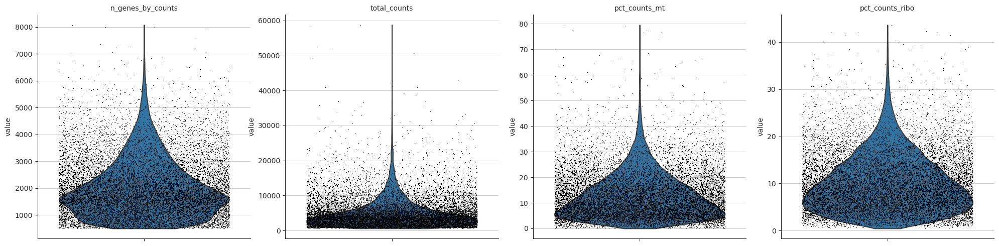

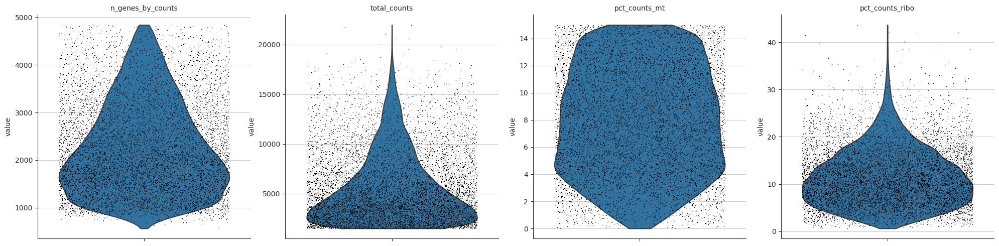

... reading from cache file cache/data-GSE205013_RAW-GSM6204114_P06_matrix.h5ad
filtered out 2693 cells that have less than 500 genes expressed


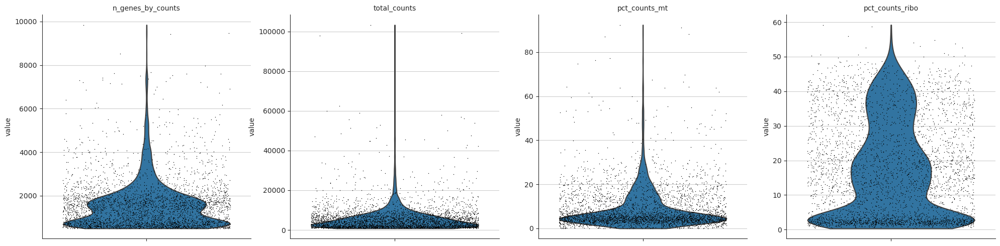

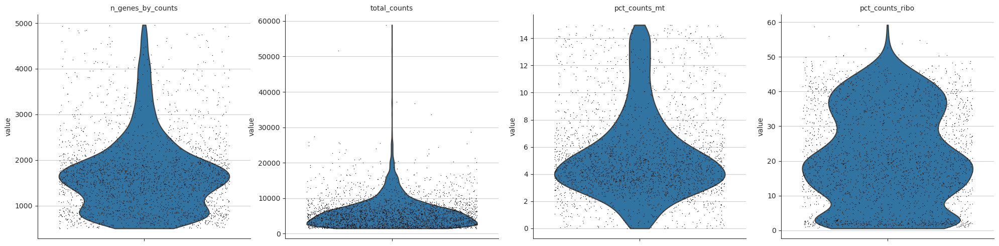

... reading from cache file cache/data-GSE205013_RAW-GSM6204115_P07_matrix.h5ad
filtered out 942 cells that have less than 500 genes expressed


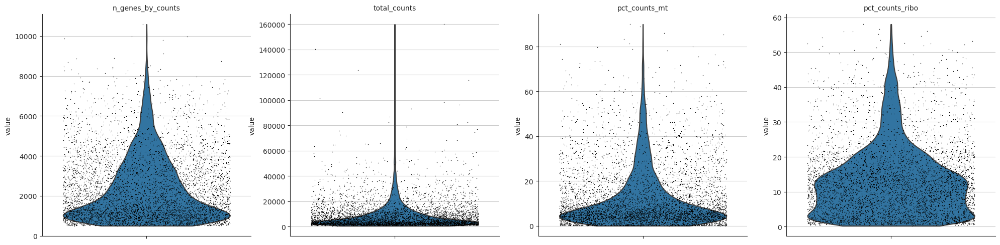

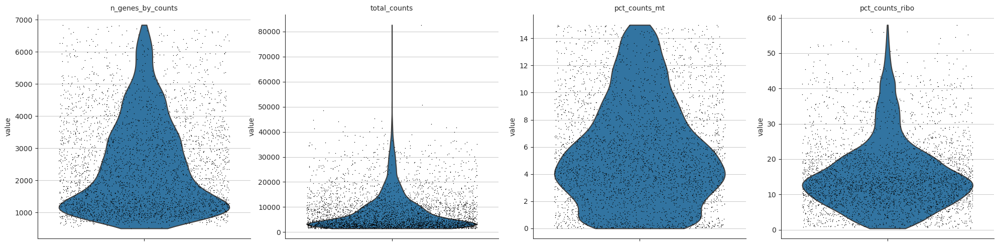

... reading from cache file cache/data-GSE205013_RAW-GSM6204116_P08_matrix.h5ad
filtered out 330 cells that have less than 500 genes expressed


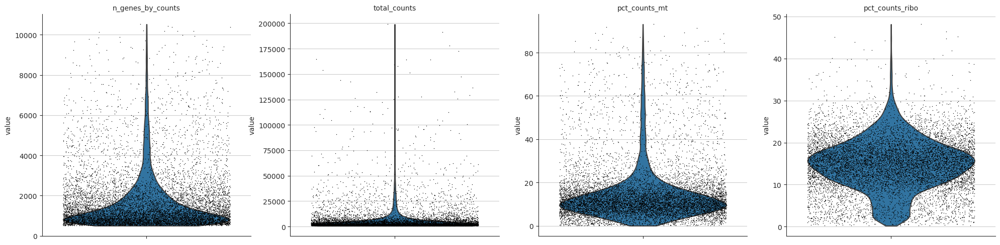

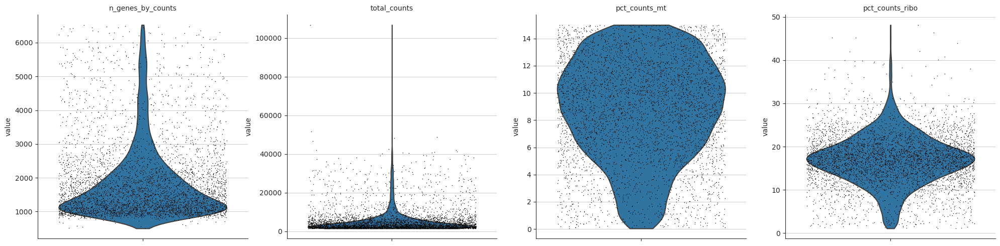

... reading from cache file cache/data-GSE205013_RAW-GSM6204117_P09_matrix.h5ad
filtered out 974 cells that have less than 500 genes expressed


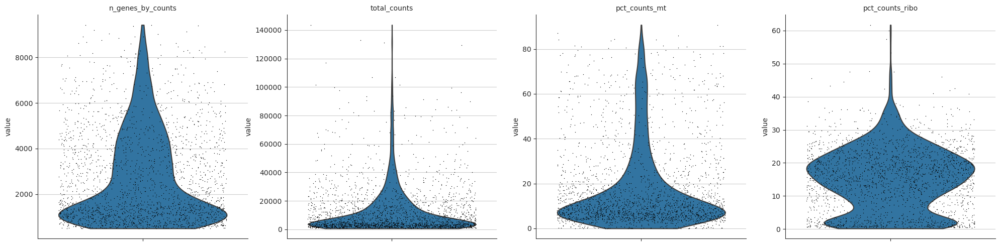

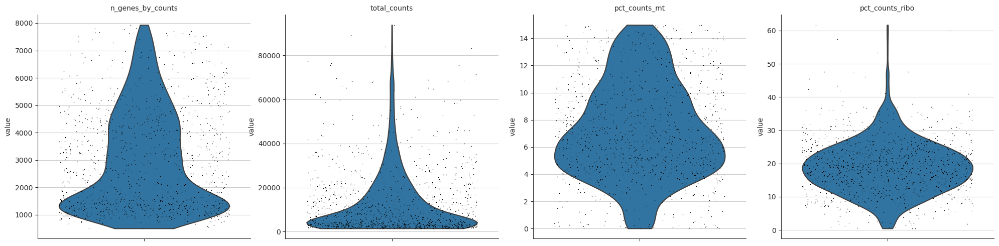

... reading from cache file cache/data-GSE205013_RAW-GSM6204118_P10_matrix.h5ad
filtered out 961 cells that have less than 500 genes expressed


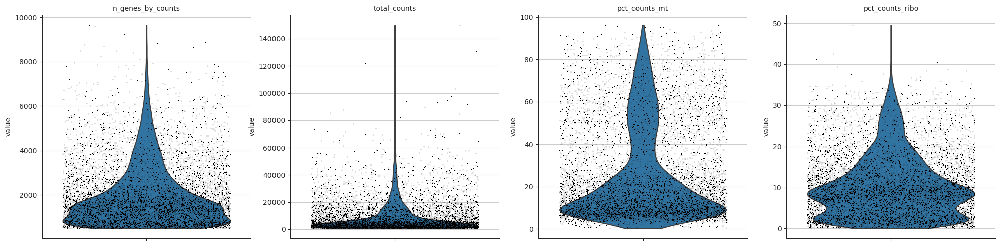

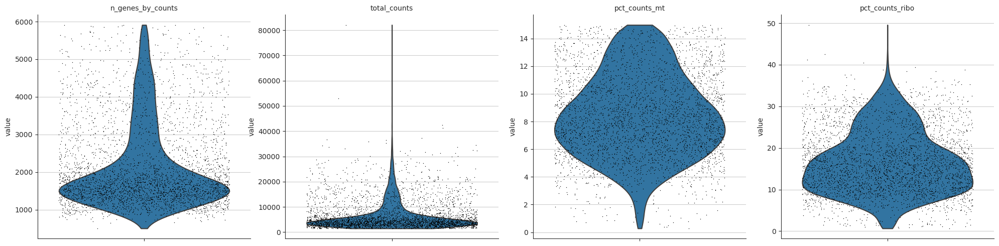

... reading from cache file cache/data-GSE205013_RAW-GSM6204119_P11_matrix.h5ad
filtered out 1718 cells that have less than 500 genes expressed


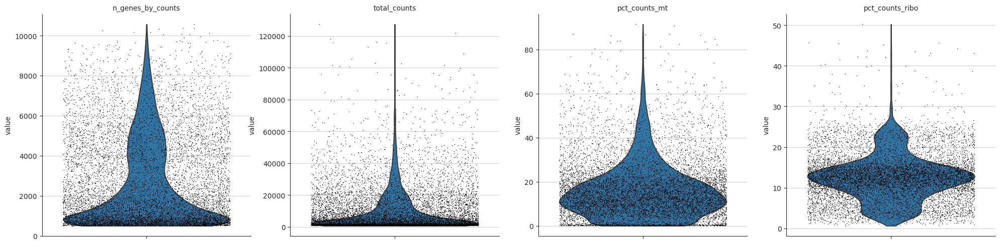

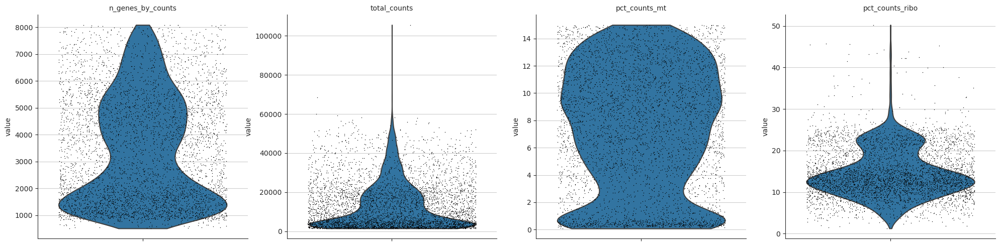

... reading from cache file cache/data-GSE205013_RAW-GSM6204120_P12_matrix.h5ad
filtered out 5034 cells that have less than 500 genes expressed


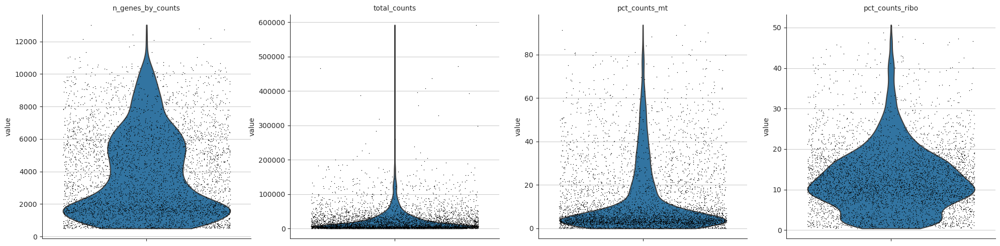

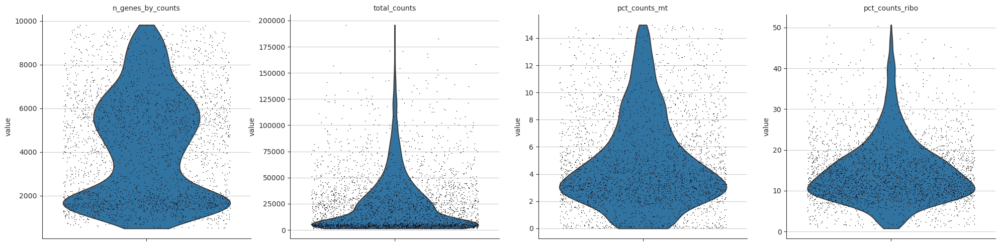

... reading from cache file cache/data-GSE205013_RAW-GSM6204121_P13_matrix.h5ad
filtered out 897 cells that have less than 500 genes expressed


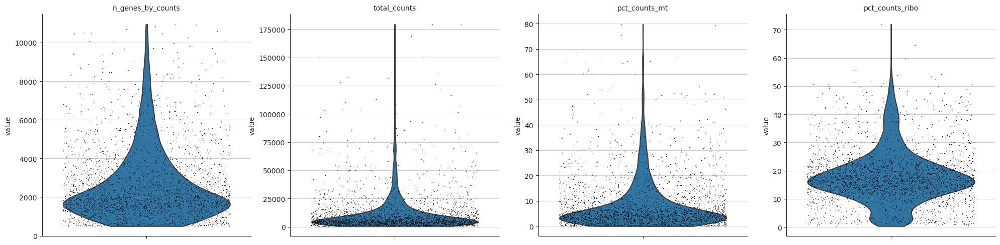

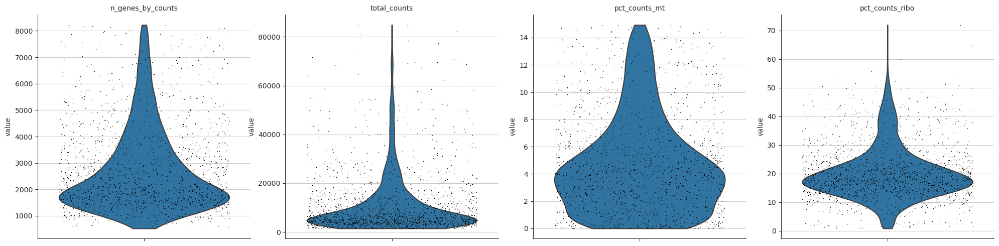

... reading from cache file cache/data-GSE205013_RAW-GSM6204122_P14_matrix.h5ad
filtered out 3318 cells that have less than 500 genes expressed


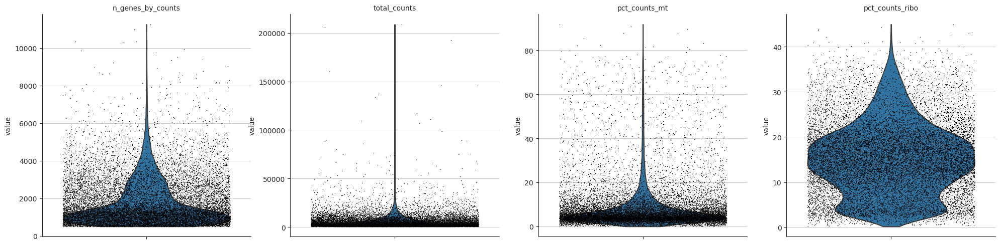

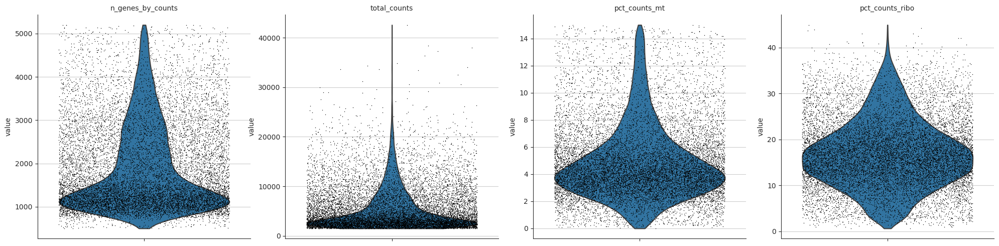

... reading from cache file cache/data-GSE205013_RAW-GSM6204123_P15_matrix.h5ad
filtered out 2307 cells that have less than 500 genes expressed


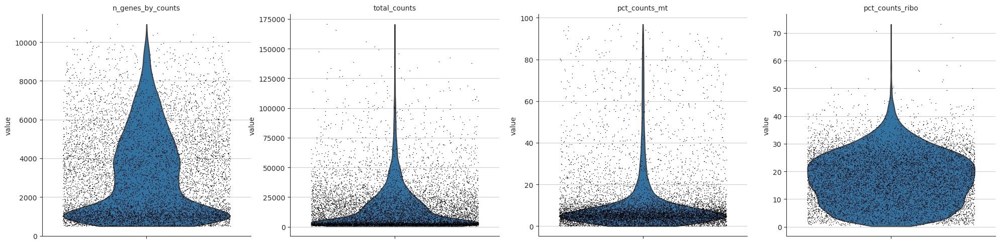

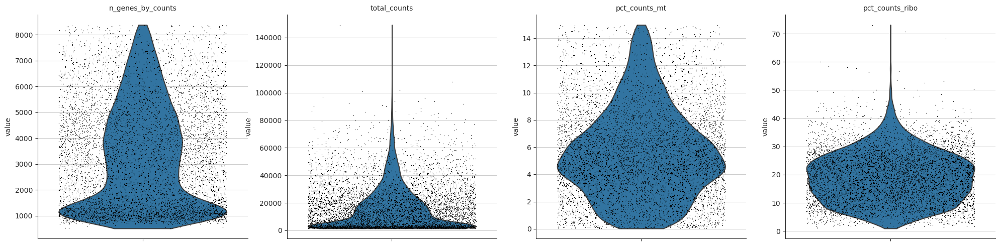

... reading from cache file cache/data-GSE205013_RAW-GSM6204124_P16_matrix.h5ad
filtered out 784 cells that have less than 500 genes expressed


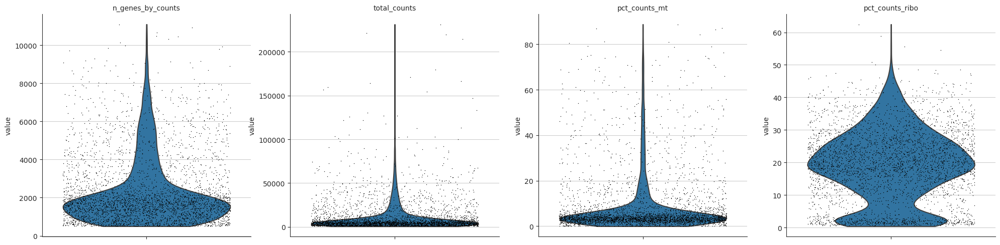

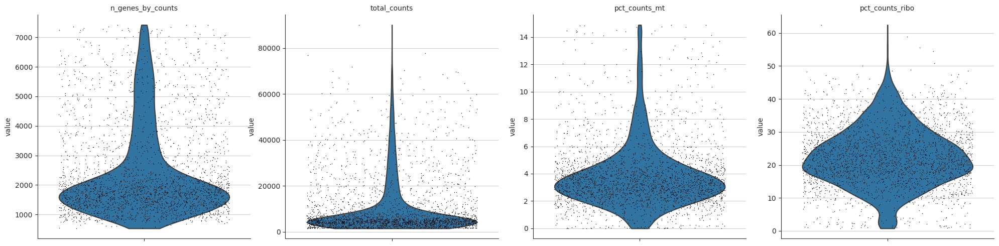

... reading from cache file cache/data-GSE205013_RAW-GSM6204125_P17_matrix.h5ad
filtered out 6322 cells that have less than 500 genes expressed


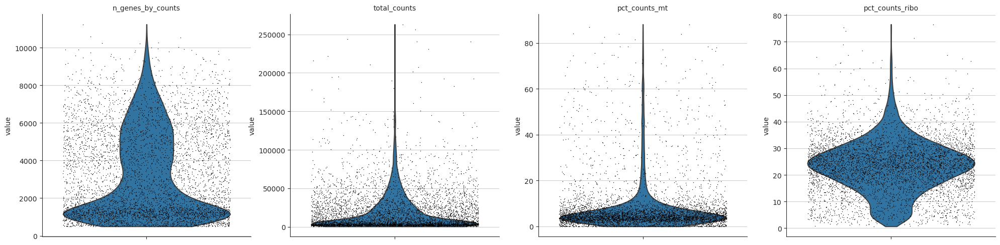

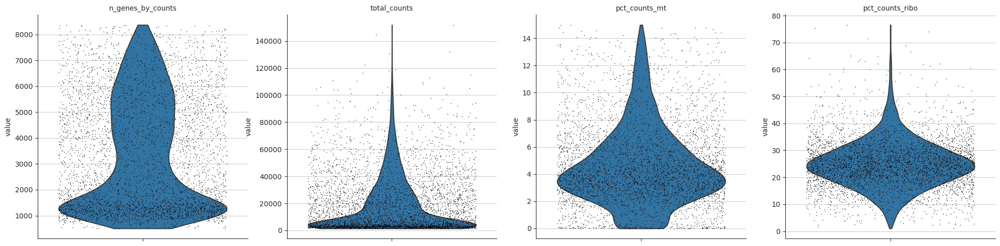

... reading from cache file cache/data-GSE205013_RAW-GSM6204126_P18_matrix.h5ad
filtered out 2938 cells that have less than 500 genes expressed


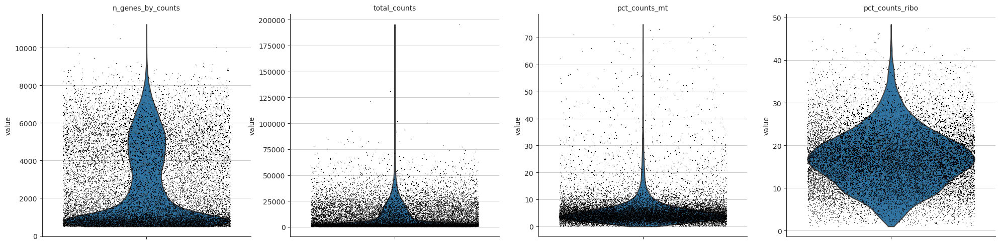

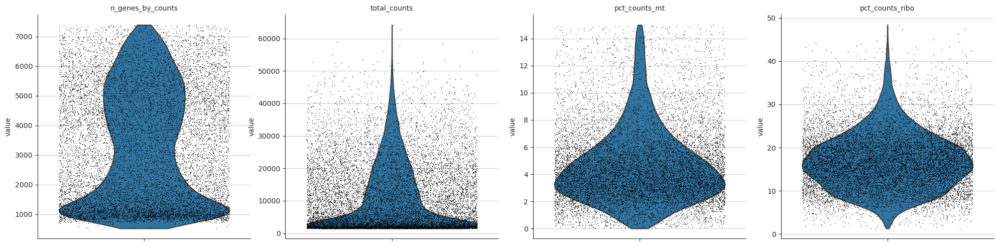

... reading from cache file cache/data-GSE205013_RAW-GSM6204127_P19_matrix.h5ad
filtered out 1485 cells that have less than 500 genes expressed


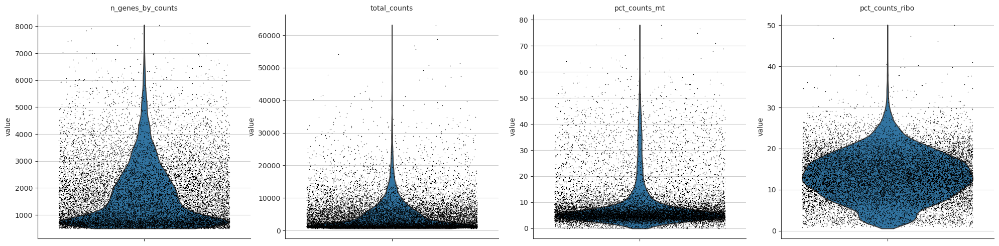

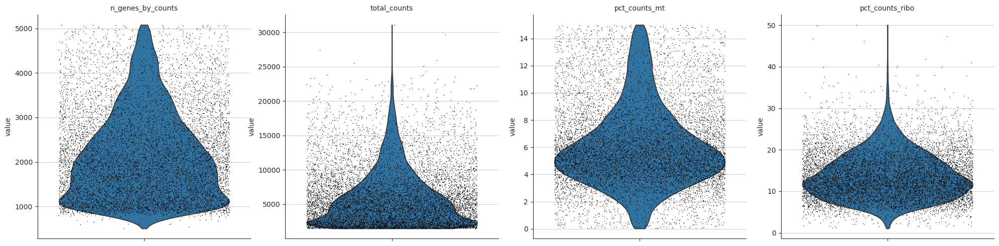

... reading from cache file cache/data-GSE205013_RAW-GSM6204128_P20_matrix.h5ad
filtered out 989 cells that have less than 500 genes expressed


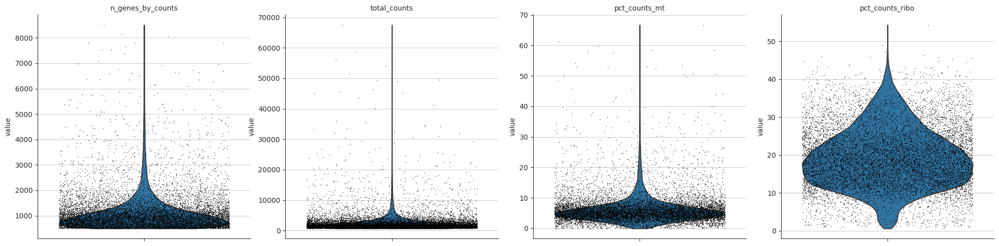

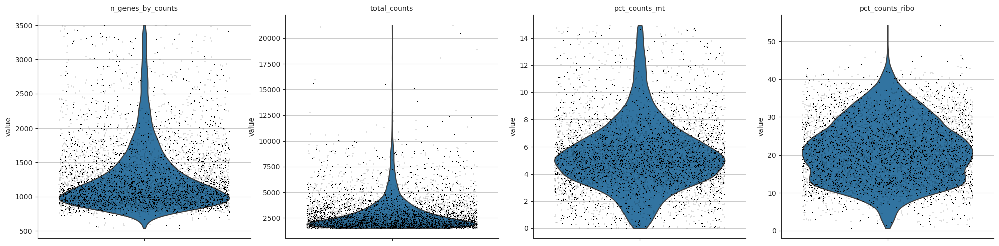

... reading from cache file cache/data-GSE205013_RAW-GSM6204129_P21_matrix.h5ad
filtered out 1276 cells that have less than 500 genes expressed


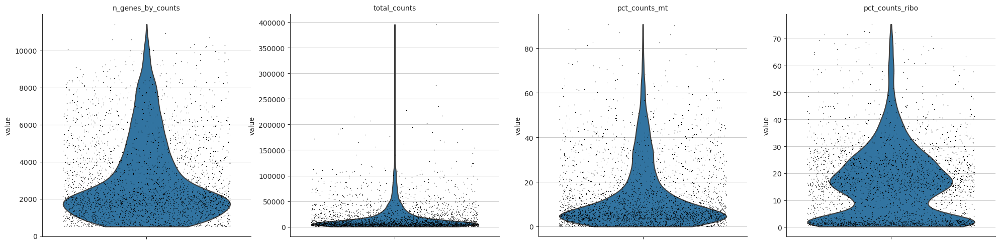

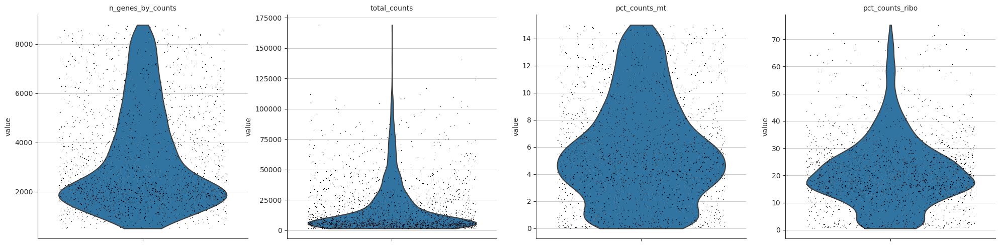

... reading from cache file cache/data-GSE205013_RAW-GSM6204130_P22_matrix.h5ad
filtered out 4426 cells that have less than 500 genes expressed


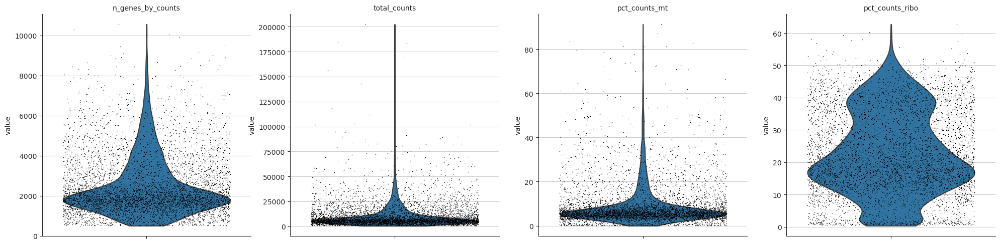

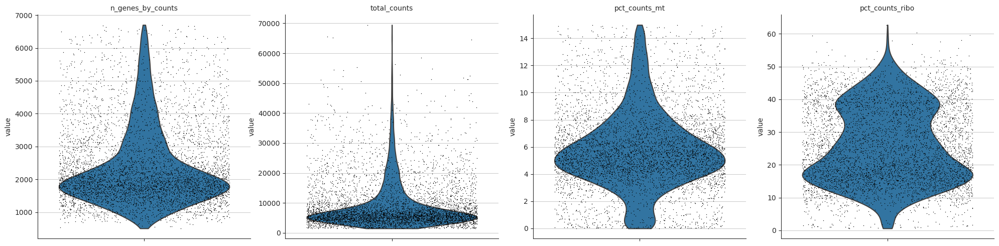

... reading from cache file cache/data-GSE205013_RAW-GSM6204131_P23_matrix.h5ad
filtered out 603 cells that have less than 500 genes expressed


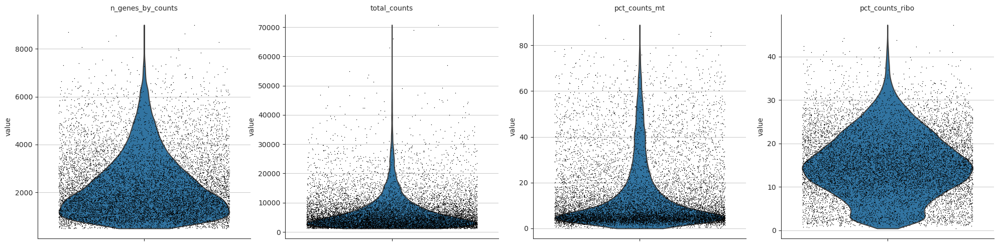

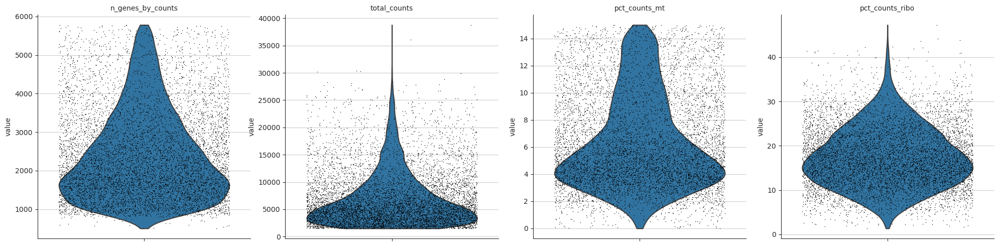

... reading from cache file cache/data-GSE205013_RAW-GSM6204132_P24_matrix.h5ad
filtered out 4152 cells that have less than 500 genes expressed


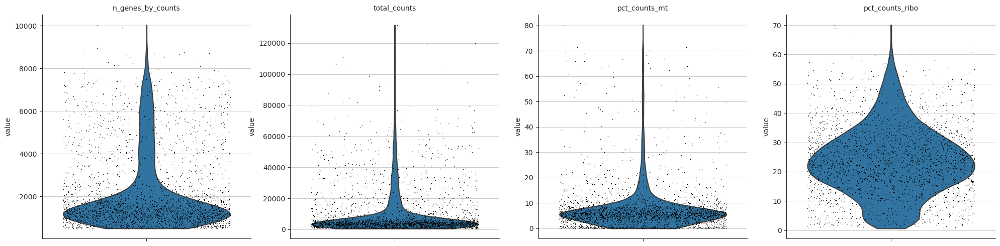

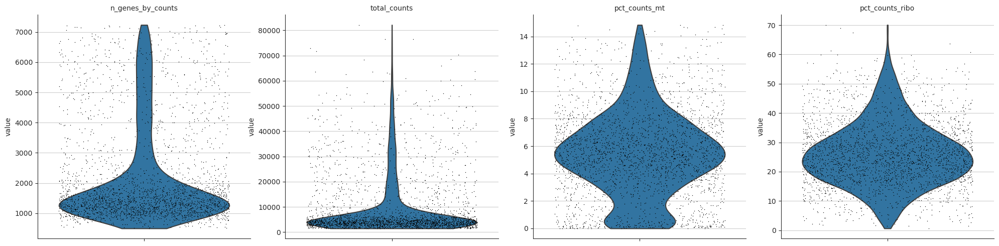

... reading from cache file cache/data-GSE205013_RAW-GSM6204133_P25_matrix.h5ad
filtered out 967 cells that have less than 500 genes expressed


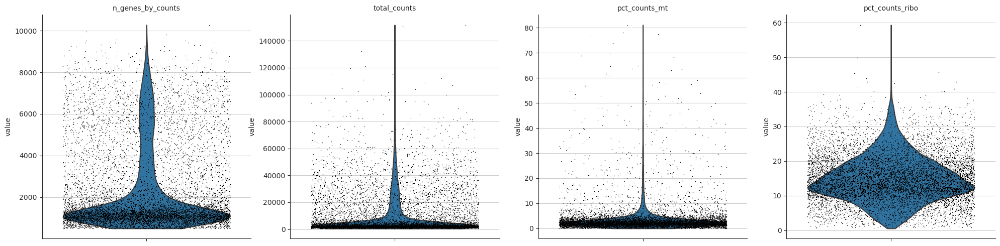

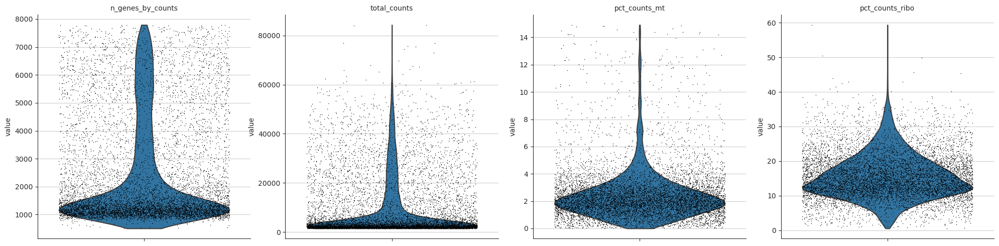

... reading from cache file cache/data-GSE205013_RAW-GSM6204134_P26_matrix.h5ad
filtered out 5580 cells that have less than 500 genes expressed


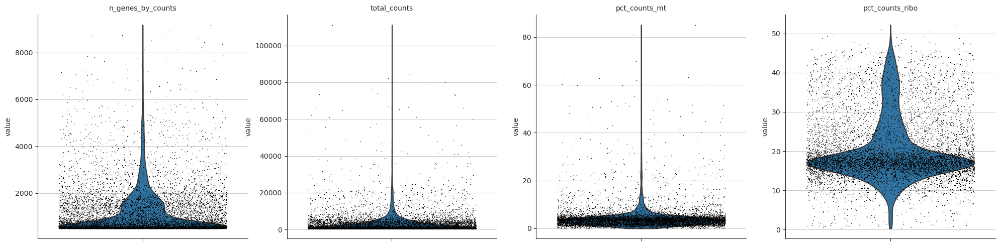

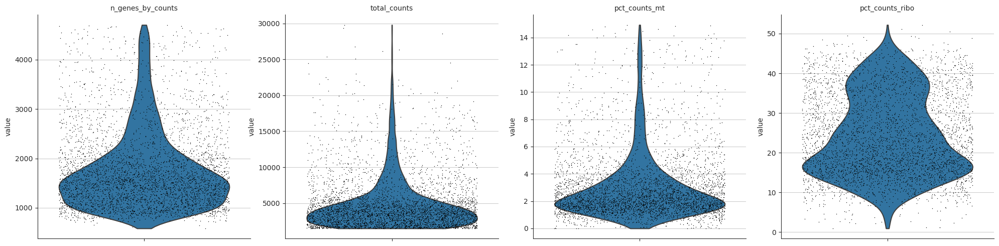

... reading from cache file cache/data-GSE205013_RAW-GSM6204135_P27_matrix.h5ad
filtered out 1589 cells that have less than 500 genes expressed


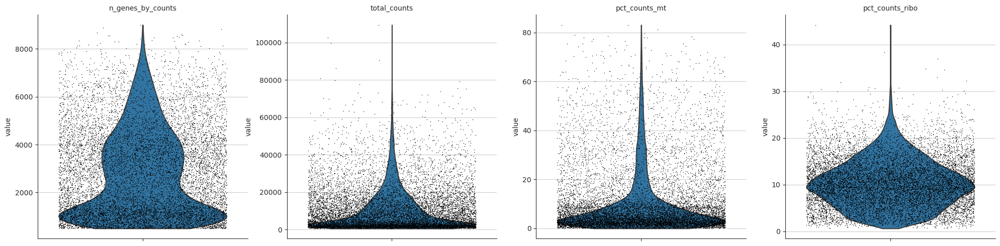

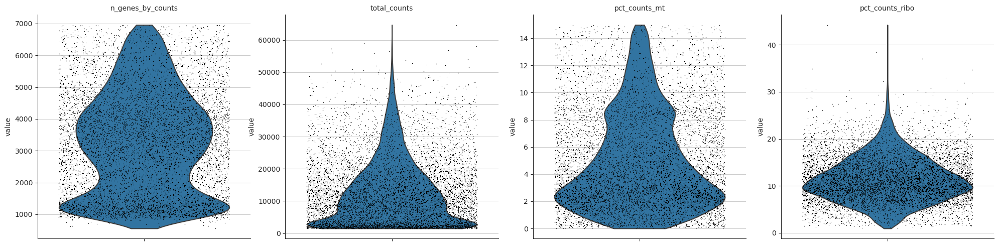

In [2]:
# Read the list of ribosomal genes (88 genes) from a csv file
ribosomal_genes = pd.read_csv('data/KEGG_RIBOSOME.v2023.1.Hs.csv', skiprows=2, header=None)[0].values

adata_list = []
for i, j in zip([f'{i:>02}' for i in range(9, 36)], [f'{i:>02}' for i in range(1, 28)]):
    # Read the data into an AnnData object
    adata = sc.read_10x_mtx('data/GSE205013_RAW/', cache=True, prefix=f'GSM62041{i}_P{j}_')

    # Add the patient number to the data
    adata.obs['Sample'] = str(int(j))
    
    # Filter out any cell that has less than 200 genes
    sc.pp.filter_cells(adata, min_genes=500)

    # Annotate the metacondrial and ribosomal genes
    adata.var['mt'] = adata.var_names.str.startswith('MT-')
    adata.var['ribo'] = adata.var_names.isin(ribosomal_genes)

    # Calculate the QC metrics with respect to metacondrial and ribosomal genes
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)

    # Plot the QC Metrics before filtering
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, multi_panel=True)

    
    # Filter out the out layers cells that has too high number of genes expressed
    n_genes_by_counts_threshold = np.quantile(adata.obs.n_genes_by_counts.values, .98)
    adata = adata[adata.obs.n_genes_by_counts < n_genes_by_counts_threshold, :]
    
    adata = adata[adata.obs.total_counts > 1500, :]
    
    # Filter out the out layers cells that has too high metaconderial genes percentage
    adata = adata[adata.obs.pct_counts_mt < 15, :]
    
    # # Filter out the out layers cells that has too high ribosomal genes percentage
    # pct_counts_ribo_threshold = np.quantile(adata.obs.pct_counts_ribo.values, .99)
    # adata = adata[adata.obs.pct_counts_ribo < pct_counts_ribo_threshold]

    # Plot the QC Metrics before filtering
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, multi_panel=True)
    
    adata_list.append(adata)

In [3]:
# Concatenate the data
adata = sc.concat(adata_list)

# Delet the list of AnnData objects
del adata_list

adata.obs_names_make_unique()

adata

/home/ahmed/anaconda3/envs/scrna/lib/python3.11/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 160033 × 36601
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'

# Continue the preprocessing
* Filter out any gene expresed by less than 10 cells
* Normalize then take the logarithm

In [4]:
# Filter out any gene expresed by less than 10 cells
sc.pp.filter_genes(adata, min_cells=10)

# Normalize counts to 10,000 reads per cell..
sc.pp.normalize_total(adata, target_sum=1e4)

# Logarithm the data using log n+1 transform
sc.pp.log1p(adata)

adata

filtered out 6928 genes that are detected in less than 10 cells
normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 160033 × 29673
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells'
    uns: 'log1p'

# Explore the counts of the genes

normalizing counts per cell
    finished (0:00:01)


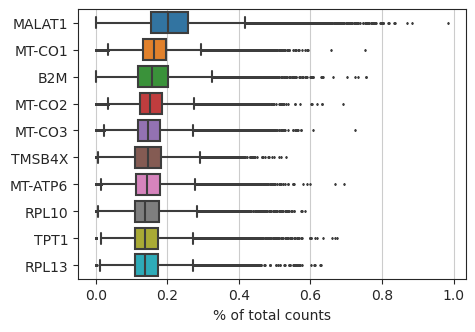

In [5]:
# Show genes that yield highest fraction of counts
sc.pl.highest_expr_genes(adata, n_top=10)

# Violin plots of QC metrics

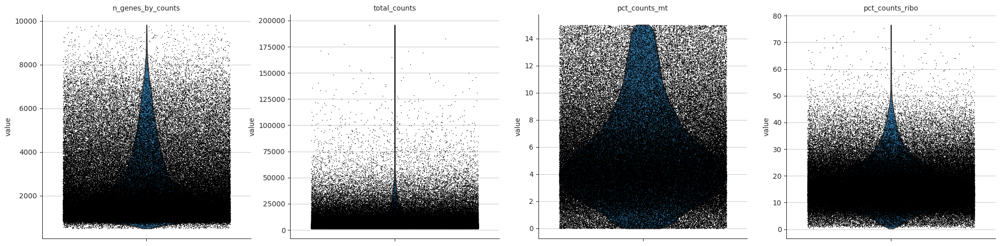

In [6]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, multi_panel=True)

## Scatter plots of QC metrics

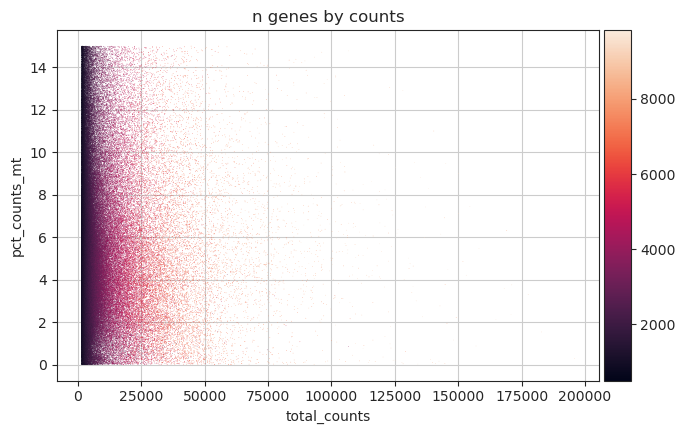

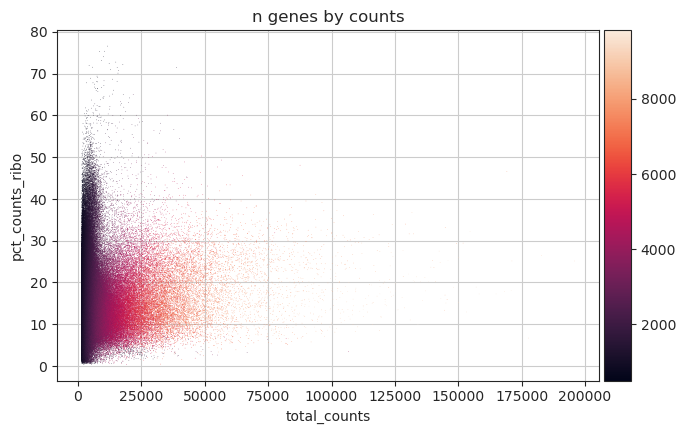

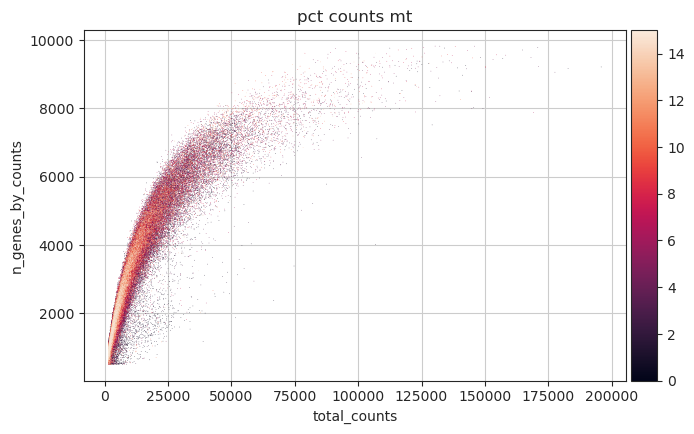

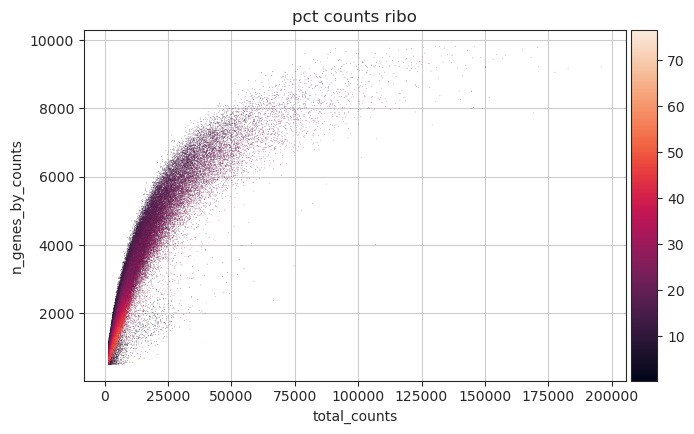

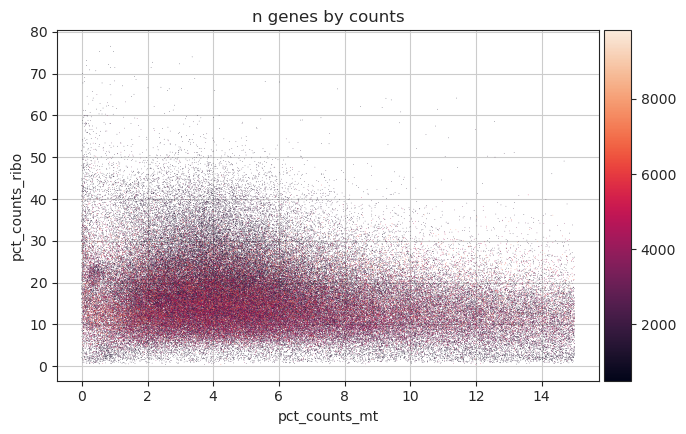

In [7]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color = 'n_genes_by_counts')
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color = 'n_genes_by_counts')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color = 'pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color = 'pct_counts_ribo')
sc.pl.scatter(adata, x='pct_counts_mt', y='pct_counts_ribo', color = 'n_genes_by_counts')

# Identify the Highly Variable Genes (HVGs)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


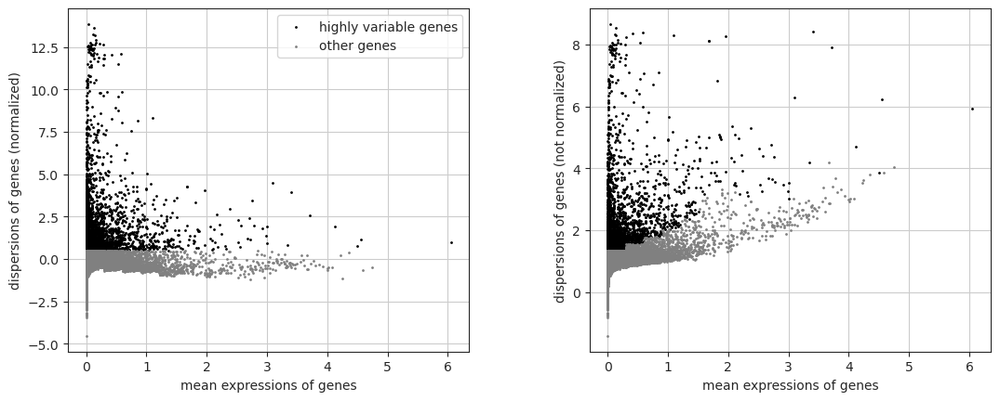

In [8]:
# Select the top 3000 HVGs
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

# Plot dispersion vs expression
sc.pl.highly_variable_genes(adata)

# Dimension reduction 
* Filtering out the low variable genes
* Apply principal component analysis (PCA)

In [9]:
# Filter out the low variable genes
adata = adata[:, adata.var.highly_variable]

# Regress out unwanted sources of variation (Can be harmful if you have many cell types)
# sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt', 'pct_counts_ribo'])

# Scale to unit variance for PCA, clip values exceding var 10
sc.pp.scale(adata, max_value=10)

# Reduce the dimensionality of the data using PCA
sc.tl.pca(adata, svd_solver='arpack', n_comps=200)

adata

/home/ahmed/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:50)


AnnData object with n_obs × n_vars = 160033 × 3000
    obs: 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

# How many PCs should we use to cluster?

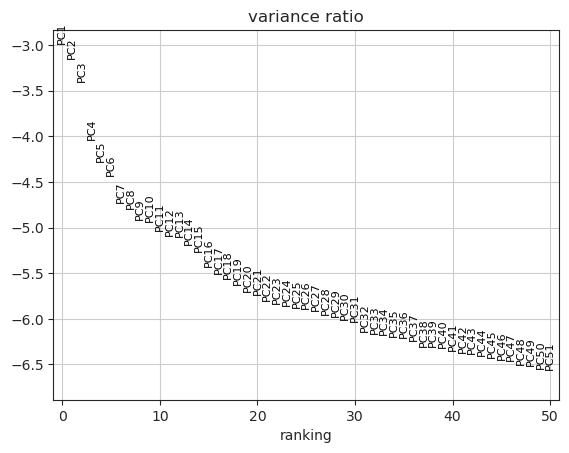

In [10]:
# visualize screen plot
sc.pl.pca_variance_ratio(adata, log=True)

# Computing the neighborhood graph

In [11]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=30)

computing neighbors
    using 'X_pca' with n_pcs = 30


/home/ahmed/anaconda3/envs/scrna/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/ahmed/anaconda3/envs/scrna/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/ahmed/anaconda3/envs/scrna/lib/python3.11/site-packages/umap/distanc

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:39)


# Visualizing data with umap

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:50)


/home/ahmed/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


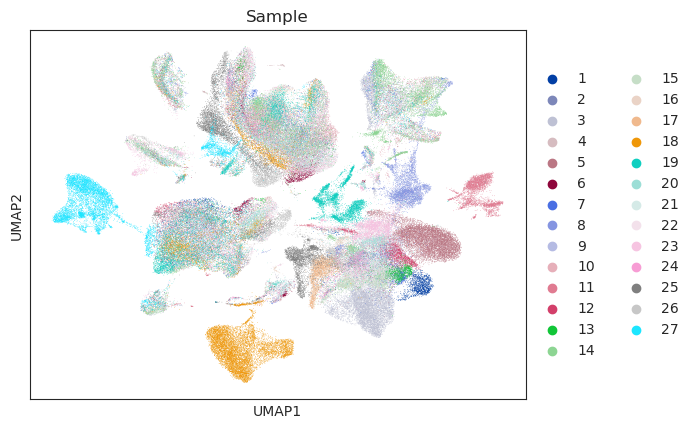

In [12]:
# Calculate the umap
sc.tl.umap(adata)

# Plot the clusters using umap
sc.pl.umap(adata, color=['Sample'])

# Clustering the neighborhood graph using leiden algorithm

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:40)


/home/ahmed/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


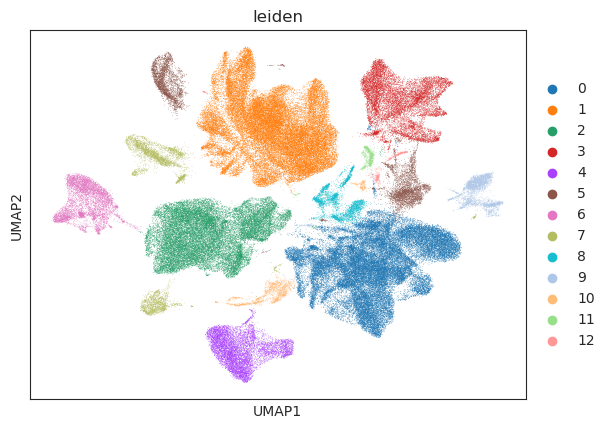

In [13]:
# Run leiden clustering
sc.tl.leiden(adata, resolution = 0.1)

# Plot the clusters using umap
sc.pl.umap(adata, color=['leiden'])